## Steps for Applied Machine Learning (ML) for Hackathons :

1.  Understand the Problem Statement & Import Packages and Datasets.  

2.  Perform EDA (Exploratory Data Analysis) - Understanding the Datasets :

       *       Explore Train and Test Data and get to know what each Column / Feature denotes.
       *       Check for Imbalance of Target Column in Datasets.
       *       Visualize Count Plots & Unique Values to infer from Datasets.
            
3.  Check Duplicate Rows from Train Data if present.

4.  Fill/Impute Missing Values Continuous - Mean/Median/Any Specific Value & Categorical - Others/ForwardFill/BackFill.

5.  Feature Engineering 

      *       Feature Selection - Selection of Most Important Existing Features.
      *       Feature Creation  - Creation  of New Feature from the Existing Features.
      
6.  Split Train Data into Predictors(Independent) & Target(Dependent).      
7.  Data Encoding - Label Encoding, OneHot Encoding and Data Scaling - MinMaxScaler, StandardScaler, RobustScaler
8.  Create Baseline ML Model for Binary Classification Problem.
9.  Improve ML Model with Voting Classifier with MODEL Evaluation METRIC - "F1" and Predict Target "is_promoted".
10. Result Submission, Check Leaderboard & Improve "F1" Score

## 1.  Understand the Problem Statement & Import Packages and Datasets :

In [1]:
# Warning Libraries :
import warnings
warnings.filterwarnings("ignore")

# Scientific and Data Manipulation Libraries :
import pandas as pd
import numpy as np
import math
import gc
import os

# ML Libraries :
from sklearn.preprocessing            import LabelEncoder, OneHotEncoder 
from sklearn.preprocessing            import StandardScaler, MinMaxScaler, Normalizer, RobustScaler, MaxAbsScaler
from sklearn.model_selection          import KFold, StratifiedKFold, train_test_split, cross_val_score
from sklearn.tree                     import DecisionTreeClassifier
from sklearn.ensemble                 import VotingClassifier, RandomForestClassifier
from sklearn.metrics                  import f1_score, confusion_matrix, classification_report

# Boosting Algorithms :
from xgboost                          import XGBClassifier
from catboost                         import CatBoostClassifier
from lightgbm                         import LGBMClassifier

# Data Visualization Libraries :
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.io as pio
import plotly.graph_objects as go
import plotly.express as px

In [2]:
np.random.seed(0)

In [3]:
# Set Location path :
import os
os.chdir(r"C:/Users/Vetrivel_PS/Desktop//1. AV - Hackathon/1. HR_Analytics/")
# os.chdir(r"C:/Users/LD196YS/Desktop/Others/0.                          Winning_Kaggle/1. AV - Hackathon/0.    OLD - HR - New Pipeline CODE/")

In [4]:
train = pd.read_csv('1. Data/train.csv')
test = pd.read_csv('1. Data/test.csv')

# Look at the head() of the data
display('Train Head :',train)
display('Test Head :',test.head())

'Train Head :'

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0


'Test Head :'

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,8724,Technology,region_26,Bachelor's,m,sourcing,1,24,NaN,1,1,0,77
1,74430,HR,region_4,Bachelor's,f,other,1,31,3.0,5,0,0,51
2,72255,Sales & Marketing,region_13,Bachelor's,m,other,1,31,1.0,4,0,0,47
3,38562,Procurement,region_2,Bachelor's,f,other,3,31,2.0,9,0,0,65
4,64486,Finance,region_29,Bachelor's,m,sourcing,1,30,4.0,7,0,0,61


## 2.  Perform EDA (Exploratory Data Analysis) - Understanding the Datasets :

In [5]:
# Display Information of Train data :

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [47]:
# Display Information of Test data :

test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23490 entries, 0 to 23489
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   employee_id           23490 non-null  int64   
 1   department            23490 non-null  object  
 2   region                23490 non-null  object  
 3   education             23490 non-null  object  
 4   gender                23490 non-null  object  
 5   recruitment_channel   23490 non-null  object  
 6   no_of_trainings       23490 non-null  int64   
 7   age                   21986 non-null  category
 8   previous_year_rating  23490 non-null  float64 
 9   length_of_service     23490 non-null  int64   
 10  KPIs_met >80%         23490 non-null  int64   
 11  awards_won?           23490 non-null  int64   
 12  avg_training_score    23490 non-null  int64   
dtypes: category(1), float64(1), int64(6), object(5)
memory usage: 2.2+ MB


In [6]:
# Display Descriptive Statistics of Train data :

train.describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


In [ ]:
# Display Descriptive Statistics of Test data :

test.describe()

In [7]:
# Display No of Unqiue Values and Actual Unique Values :

def display_unique(data):
    for column in data.columns :
        
        print("No of Unique Values in "+column+" Column are : "+str(data[column].nunique()))
        print("Actual Unique Values in "+column+" Column are : "+str(data[column].sort_values(ascending=True,na_position='last').unique() ))
        print("")
        
display_unique(train)

No of Unique Values in employee_id Column are : 54808
Actual Unique Values in employee_id Column are : [    1     2     4 ... 78296 78297 78298]

No of Unique Values in department Column are : 9
Actual Unique Values in department Column are : ['Analytics' 'Finance' 'HR' 'Legal' 'Operations' 'Procurement' 'R&D'
 'Sales & Marketing' 'Technology']

No of Unique Values in region Column are : 34
Actual Unique Values in region Column are : ['region_1' 'region_10' 'region_11' 'region_12' 'region_13' 'region_14'
 'region_15' 'region_16' 'region_17' 'region_18' 'region_19' 'region_2'
 'region_20' 'region_21' 'region_22' 'region_23' 'region_24' 'region_25'
 'region_26' 'region_27' 'region_28' 'region_29' 'region_3' 'region_30'
 'region_31' 'region_32' 'region_33' 'region_34' 'region_4' 'region_5'
 'region_6' 'region_7' 'region_8' 'region_9']

No of Unique Values in education Column are : 3
Actual Unique Values in education Column are : ["Bachelor's" 'Below Secondary' "Master's & above" nan]

No 

In [50]:
# Displat How Each Feature is related to Target Variable in a Flow :

fig = px.parallel_categories(train[['department','education','gender','previous_year_rating','KPIs_met >80%',
                                    'recruitment_channel',
                                   'is_promoted']], 
                             color="is_promoted", 
                             color_continuous_scale=px.colors.sequential.Aggrnyl  )
fig.show()

Help on module _plotly_utils.colors.sequential in _plotly_utils.colors:

NAME
    _plotly_utils.colors.sequential - Sequential color scales are appropriate for most continuous data, but in some cases it can be helpful to use a `plotly.colors.diverging` or `plotly.colors.cyclical` scale instead. The color scales in this module are mostly meant to be passed in as the `color_continuous_scale` argument to various functions.

FUNCTIONS
    swatches(template=None)
        Parameters
        ----------
        template : str or dict or plotly.graph_objects.layout.Template instance
            The figure template name or definition.
        
        Returns
        -------
        fig : graph_objects.Figure containing the displayed image
            A `Figure` object. This figure demonstrates the color scales and
            sequences in this module, as stacked bar charts.

DATA
    Aggrnyl = ['rgb(36, 86, 104)', 'rgb(15, 114, 121)', 'rgb(13, 143, 129)...
    Aggrnyl_r = ['rgb(237, 239, 93)', 

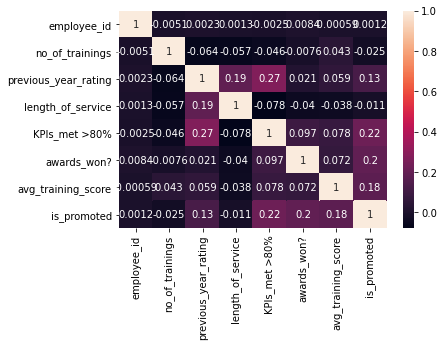

In [41]:
# Display Correlation between Features through HeatMap - Ligther Color Higher Correlation if Close to 1 :

sns.heatmap(train.corr(), annot = True);

## 3.  Check for Duplicate Rows from Train Data if present :

In [51]:
# Python Method 4 : Removes Data Duplicates while Retaining the First one - Similar to SQL DISTINCT :

def remove_duplicate(data):
    
    print("BEFORE REMOVING DUPLICATES - No. of Rows = ",data.shape[0])
    data.drop_duplicates(keep="first", inplace=True) 
    print("AFTER REMOVING DUPLICATES  - No. of Rows = ",data.shape[0])
    
    return "Checked Duplicates"

# Remove Duplicates from "train" data :

remove_duplicate(train)

# No Duplicates at all !!!

BEFORE REMOVING DUPLICATES - No. of Rows =  54808
AFTER REMOVING DUPLICATES  - No. of Rows =  54808


'Checked Duplicates'

## 4.  Fill/Impute Missing Values :
## Continuous - Mean/Median/Zero(Specific Value) | Categorical - Forward/BackFill/Others :

In [52]:
# Display the Missing Values in Train and Test :

print("Train : ")
display(train.isnull().sum())
print("Test : ")
display(test.isnull().sum())

# Missing Values are present in previous_year_rating and education columns in both Train and Test Data 
# Let's Handle it based on Intuition !

Train


employee_id                0
department                 0
region                     0
education                  0
gender                     0
recruitment_channel        0
no_of_trainings            0
age                     3486
previous_year_rating       0
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

Test


employee_id                0
department                 0
region                     0
education                  0
gender                     0
recruitment_channel        0
no_of_trainings            0
age                     1504
previous_year_rating       0
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

In [11]:
# Why is Data Missing in Column "previous_year_rating" ? 
# 1. Data was not entered Because those employees were Freshers (i.e) length_of_service = 1 
# 2. No Data would have been there in the Data Source itself for these employees.
# Logically we are imputing with "0" as Freshers with 1 Year Experince may not have previous_year_rating at all!

# Filling Missing Values in Train and Test :

train["previous_year_rating"] = train["previous_year_rating"].fillna(0)
test["previous_year_rating"] = test["previous_year_rating"].fillna(0)

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

Experienced    50684
Fresher         4124
Name: Fresher, dtype: int64

,previous_year_rating,length_of_service,Fresher
10,0.0,1,Fresher
23,0.0,1,Fresher
29,0.0,1,Fresher
56,0.0,1,Fresher
58,0.0,1,Fresher
...,...,...,...
54703,0.0,1,Fresher
54734,0.0,1,Fresher
54746,0.0,1,Fresher
54773,0.0,1,Fresher


,previous_year_rating,length_of_service,Fresher
0,5.0,8,Experienced
1,5.0,4,Experienced
2,3.0,7,Experienced
3,1.0,10,Experienced
4,3.0,2,Experienced
5,3.0,7,Experienced
6,3.0,5,Experienced
7,3.0,6,Experienced
8,4.0,5,Experienced
9,5.0,5,Experienced


In [45]:
train['Fresher'] = train['previous_year_rating'].apply(lambda x: 'Fresher' if x ==0 else 'Experienced')

display( train['Fresher'].value_counts() )
display( train[["previous_year_rating","length_of_service",'Fresher']][train['Fresher'] =='Fresher'] )
display( train[["previous_year_rating","length_of_service",'Fresher']].head(25) )

del train['Fresher']

Experienced    50684
Fresher         4124
Name: Fresher, dtype: int64

,previous_year_rating,length_of_service,Fresher
10,0.0,1,Fresher
23,0.0,1,Fresher
29,0.0,1,Fresher
56,0.0,1,Fresher
58,0.0,1,Fresher
...,...,...,...
54703,0.0,1,Fresher
54734,0.0,1,Fresher
54746,0.0,1,Fresher
54773,0.0,1,Fresher


,previous_year_rating,length_of_service,Fresher
0,5.0,8,Experienced
1,5.0,4,Experienced
2,3.0,7,Experienced
3,1.0,10,Experienced
4,3.0,2,Experienced
5,3.0,7,Experienced
6,3.0,5,Experienced
7,3.0,6,Experienced
8,4.0,5,Experienced
9,5.0,5,Experienced


In [ ]:
# Display Missing Values in Train and Test data :

display("Train : ", train.isnull().sum())
display("Test : ",test.isnull().sum())

In [12]:
# ffill -> Forward fill that fills the Missing Value with Previous Row Value 
# If Prev. row Value is NaN ,moves to the next element without filling 

# bfill -> Backward fill that fills the Missing Value with Next Row Value   
# If Next. row Value is NaN ,moves to the next element without filling 

# Filling with Mode and New Category called "Others" are Most commonly Used Techniques which didn't work here.
# So we can assume that while Collecting Data Relevant Members Data were collected Close to one another.

train["education"] = train["education"].ffill(axis = 0)
train["education"] = train["education"].bfill(axis = 0)

test["education"] = test["education"].ffill(axis = 0)
test["education"] = test["education"].bfill(axis = 0)

display("Train : ", train.isnull().sum())
display("Test : ",test.isnull().sum())

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
is_promoted             0
dtype: int64

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
dtype: int64

## 5.  Feature Engineering :

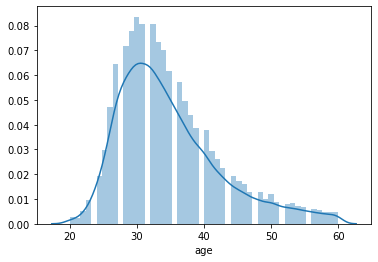

In [13]:
# Based on Age Distribution - Most of the Employees are in range 20-40 who will be also waiting for a Promotion
# so we have created 2 Bins 20-29, 29-39 and remaining 1 Bin for 39-49.
# displot -> plot a univariate(Single Feature) distribution of observations.

sns.distplot(train['age'])

train['age'] = pd.cut( x=train['age'], bins=[20, 29, 39, 49], labels=['20', '30', '40'] )
test['age']  = pd.cut( x=test['age'], bins=[20, 29, 39, 49],  labels=['20', '30', '40'] )

## 6. Split Train Data into Predictors(Independent) & Target(Dependent) :

In [14]:
# Split train into X_train (Features) and y_train (Target) :

X_train = train[[ "department", "region", "education", "gender", 
                 "recruitment_channel", "no_of_trainings", "age", "previous_year_rating", 
                 "length_of_service", "KPIs_met >80%", "awards_won?", "avg_training_score" ]]

y_train = train['is_promoted']
y_train = y_train.to_frame()

X_test = test[[ "department", "region", "education", "gender", 
               "recruitment_channel", "no_of_trainings", "age", "previous_year_rating", 
               "length_of_service", "KPIs_met >80%", "awards_won?", "avg_training_score" ]]

## 7.1  Data Encoding : Label Encoding, OneHot Encoding :

In [15]:
def data_encoding( encoding_strategy , encoding_data , encoding_columns ):
    
    if encoding_strategy == "LabelEncoding":
        print("IF LabelEncoding")
        Encoder = LabelEncoder()
        for column in encoding_columns :
            print("column",column )
            encoding_data[ column ] = Encoder.fit_transform(tuple(encoding_data[ column ]))
        
    elif encoding_strategy == "OneHotEncoding":
        print("ELIF OneHotEncoding")
        encoding_data = pd.get_dummies(encoding_data)
        
    dtypes_list =['float64','float32','int64','int32']
    encoding_data.astype( dtypes_list[0] ).dtypes
    
    return encoding_data

In [40]:
# Quote :
# Applied One Hot Encoding - it will be applied to Object/Categorical Columns Only :
# It's most common to one-hot encode these "object" columns, since they can't be plugged directly into most models. 
# Pandas offers a convenient function called "get_dummies" to get one-hot encodings.
# Many machine learning algorithms cannot operate on label data directly. 
# They require all input variables and output variables to be numeric.
# This means that categorical data must be converted to a numerical form.
# a one-hot encoding can be applied to the integer representation. 
# This is where the integer encoded variable is removed and a new binary variable is added for each unique integer value.
# - Jason Brownlee 

data = ["Red","Blue","Green","Red","Blue","Blue"] 
  
df = pd.DataFrame(data, columns = ['Color']) 
  
print("Before One Hot Encoding : ")
display(df)
print("\nAfter One Hot Encoding : ")
display( pd.get_dummies(df) )

Before One Hot Encoding : 


,Color
0,Red
1,Blue
2,Green
3,Red
4,Blue
5,Blue



After One Hot Encoding : 


,Color_Blue,Color_Green,Color_Red
0,0,0,1
1,1,0,0
2,0,1,0
3,0,0,1
4,1,0,0
5,1,0,0


In [16]:
encoding_columns  = [ "region", "age","department", "education", "gender", "recruitment_channel" ]
encoding_strategy = [ "LabelEncoding", "OneHotEncoding"]

X_train_encode = data_encoding( encoding_strategy[1] , X_train , encoding_columns )
X_test_encode =  data_encoding( encoding_strategy[1] , X_test  , encoding_columns )

ELIF OneHotEncoding
ELIF OneHotEncoding


employee_id                0
department                 0
region                     0
education                  0
gender                     0
recruitment_channel        0
no_of_trainings            0
age                     1504
previous_year_rating       0
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

In [17]:
# Display Encoded Train and Test Features :

display(X_train_encode.head())
display(X_test_encode.head())

,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Finance,department_HR,department_Legal,...,education_Below Secondary,education_Master's & above,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,age_20,age_30,age_40
0,1,5.0,8,1,0,49,0,0,0,0,...,0,1,1,0,0,0,1,0,1,0
1,1,5.0,4,0,0,60,0,0,0,0,...,0,0,0,1,1,0,0,0,1,0
2,1,3.0,7,0,0,50,0,0,0,0,...,0,0,0,1,0,0,1,0,1,0
3,2,1.0,10,0,0,50,0,0,0,0,...,0,0,0,1,1,0,0,0,1,0
4,1,3.0,2,0,0,73,0,0,0,0,...,0,0,0,1,1,0,0,0,0,1


,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Finance,department_HR,department_Legal,...,education_Below Secondary,education_Master's & above,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,age_20,age_30,age_40
0,1,0.0,1,1,0,77,0,0,0,0,...,0,0,0,1,0,0,1,1,0,0
1,1,3.0,5,0,0,51,0,0,1,0,...,0,0,1,0,1,0,0,0,1,0
2,1,1.0,4,0,0,47,0,0,0,0,...,0,0,0,1,1,0,0,0,1,0
3,3,2.0,9,0,0,65,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
4,1,4.0,7,0,0,61,0,1,0,0,...,0,0,0,1,0,0,1,0,1,0


## 7.2  Data Scaling : RobustScaler, StandardScaler, MinMaxScaler, MaxAbsScaler :

In [18]:
def data_scaling( scaling_strategy , scaling_data , scaling_columns ):
    
    if    scaling_strategy =="RobustScaler" :
        scaling_data[scaling_columns] = RobustScaler().fit_transform(scaling_data[scaling_columns])
        
    elif  scaling_strategy =="StandardScaler" :
        scaling_data[scaling_columns] = StandardScaler().fit_transform(scaling_data[scaling_columns])
        
    elif  scaling_strategy =="MinMaxScaler" :
        scaling_data[scaling_columns] = MinMaxScaler().fit_transform(scaling_data[scaling_columns])
        
    elif  scaling_strategy =="MaxAbsScaler" :
        scaling_data[scaling_columns] = MaxAbsScaler().fit_transform(scaling_data[scaling_columns])
        
    else :  # If any other scaling send by mistake still perform Robust Scalar
        scaling_data[scaling_columns] = RobustScaler().fit_transform(scaling_data[scaling_columns])
    
    return scaling_data

In [19]:
# RobustScaler is better in handling Outliers :

# QUOTED FOR DOCUMENTATION : https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.RobustScaler.html
# Standardization of a dataset is a common requirement for many machine learning estimators. 
# Typically this is done by removing the mean and scaling to unit variance. 
# However, OUTLIERS can often influence the sample mean / variance in a negative way. 
# In such cases RobustSclaer which uses the median and the interquartile range often give BETTER results.

scaling_strategy = ["RobustScaler", "StandardScaler","MinMaxScaler","MaxAbsScaler"]
X_train_scale = data_scaling( scaling_strategy[0] , X_train_encode , X_train_encode.columns )
X_test_scale  = data_scaling( scaling_strategy [0] , X_test_encode  , X_test_encode.columns )

# Display Scaled Train and Test Features :

display(X_train_scale.head())
display(X_train_scale.head())

,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Finance,department_HR,department_Legal,...,education_Below Secondary,education_Master's & above,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,age_20,age_30,age_40
0,0.0,1.0,0.75,1.0,0.0,-0.44,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,-1.0,-1.0,0.0,1.0,0.0,0.0,0.0
1,0.0,1.0,-0.25,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.50,0.0,0.0,-0.40,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0
3,1.0,-1.0,1.25,0.0,0.0,-0.40,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,-0.75,0.0,0.0,0.52,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0


,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Finance,department_HR,department_Legal,...,education_Below Secondary,education_Master's & above,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,age_20,age_30,age_40
0,0.0,1.0,0.75,1.0,0.0,-0.44,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,-1.0,-1.0,0.0,1.0,0.0,0.0,0.0
1,0.0,1.0,-0.25,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.50,0.0,0.0,-0.40,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0
3,1.0,-1.0,1.25,0.0,0.0,-0.40,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,-0.75,0.0,0.0,0.52,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0


## 8.  Create Baseline ML Model for Binary Classification Problem :

In [20]:
# Create a Dictionary (Key->Value Pairs) for "ML Model Name"-> "ML Model Functions with Hyper-Parameters" :

Classifiers = {'0.XGBoost' : XGBClassifier(learning_rate =0.1, 
                                           n_estimators=494, 
                                           max_depth=5, 
                                           subsample = 0.70, 
                                           verbosity = 0,
                                           scale_pos_weight = 2.5,
                                           updater ="grow_histmaker",
                                           base_score  = 0.2),
                            
               '1.CatBoost' : CatBoostClassifier(learning_rate=0.15, 
                                                 n_estimators=494, 
                                                 subsample=0.085, 
                                                 max_depth=5, 
                                                 scale_pos_weight=2.5),
               
               '2.LightGBM' : LGBMClassifier(subsample_freq = 2, 
                                             objective ="binary",
                                             importance_type = "gain",
                                             verbosity = -1, 
                                             max_bin = 60,
                                             num_leaves = 300,
                                             boosting_type = 'dart',
                                             learning_rate=0.15, 
                                             n_estimators=494,
                                             max_depth=5, 
                                             scale_pos_weight=2.5)
 }

print( list(Classifiers.keys()) )
print( list(Classifiers.values()) )

['0.XGBoost', '1.CatBoost', '2.LightGBM']
[XGBClassifier(base_score=0.2, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=None, importance_type='gain', interaction_constraints=None,
              learning_rate=0.1, max_delta_step=None, max_depth=5,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=494, n_jobs=None, num_parallel_tree=None,
              objective='binary:logistic', random_state=None, reg_alpha=None,
              reg_lambda=None, scale_pos_weight=2.5, subsample=0.7,
              tree_method=None, updater='grow_histmaker',
              validate_parameters=None, verbosity=0), <catboost.core.CatBoostClassifier object at 0x0000020F3A08C0C8>, LGBMClassifier(boosting_type='dart', class_weight=None, colsample_bytree=1.0,
               importance_type='gain', learning_rate=0.15, max_bin=60,
               max_depth=5, min_child_samples=20, m

## 9.  Improve ML Model with Voting Classifier with MODEL Evaluation METRIC - "F1" and Predict Target "is_promoted" :

In [21]:
voting_model = VotingClassifier(estimators=[
                                              ('XGBoost_Best', list(Classifiers.values())[0]), 
                                              ('CatBoost_Best', list(Classifiers.values())[1]),
                                              ('LightGBM_Best', list(Classifiers.values())[2]),
                                             ], 
                                              voting='soft',weights=[5,5,5.2])

voting_model.fit(X_train_scale,y_train) 

predictions_of_voting = voting_model.predict_proba( X_test_scale )[::,1]

0:	learn: 0.5626431	total: 100ms	remaining: 49.4s
1:	learn: 0.5036410	total: 115ms	remaining: 28.3s
2:	learn: 0.4624679	total: 127ms	remaining: 20.8s
3:	learn: 0.4330837	total: 143ms	remaining: 17.5s
4:	learn: 0.3937606	total: 156ms	remaining: 15.2s
5:	learn: 0.3785650	total: 168ms	remaining: 13.7s
6:	learn: 0.3637466	total: 180ms	remaining: 12.5s
7:	learn: 0.3537503	total: 193ms	remaining: 11.7s
8:	learn: 0.3387892	total: 208ms	remaining: 11.2s
9:	learn: 0.3249548	total: 222ms	remaining: 10.7s
10:	learn: 0.3216380	total: 234ms	remaining: 10.3s
11:	learn: 0.3201135	total: 248ms	remaining: 9.97s
12:	learn: 0.3180394	total: 260ms	remaining: 9.63s
13:	learn: 0.3171410	total: 274ms	remaining: 9.38s
14:	learn: 0.3117576	total: 287ms	remaining: 9.18s
15:	learn: 0.3103695	total: 303ms	remaining: 9.05s
16:	learn: 0.3070378	total: 319ms	remaining: 8.94s
17:	learn: 0.3054026	total: 332ms	remaining: 8.79s
18:	learn: 0.3003070	total: 346ms	remaining: 8.65s
19:	learn: 0.2997251	total: 363ms	remaini

## 10. Result Submission, Check Leaderboard & Improve "F1" Score :

In [22]:
# Round off the Probability Results :
predictions = [int(round(value)) for value in predictions_of_voting]

# Create a Dataframe Table for Submission Purpose :
Result_Promoted = pd.DataFrame({'employee_id': test["employee_id"], 'is_promoted' : predictions})

# Name the Submission File and Download in Current Working Path :
file_name = "RANK_4_ENSEMBLE-VOTING_SOFT_5_5_5.2"
pd.DataFrame(Result_Promoted).to_csv(file_name+".csv",index=False)

### Public LB Score : 0.5337 & Rank : 4 out of 3000 Active Participants !!!
### Keeping Things Simple is more important in Data Science :-)
### Thanks a lot for Reading friends

['0.XGBoost', '1.CatBoost', '2.LightGBM']


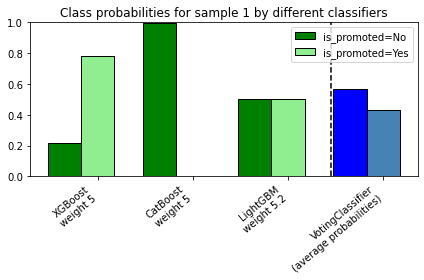

In [25]:
# Reference Link : https://scikit-learn.org/stable/auto_examples/ensemble/plot_voting_probas.html
        
Classifiers = {'0.XGBoost' : XGBClassifier(learning_rate =0.1, 
                                           n_estimators=494, 
                                           max_depth=5,
                                           subsample = 0.70, 
                                           verbosity = 0,
                                           scale_pos_weight = 2.5,
                                           updater ="grow_histmaker",
                                           base_score  = 0.2),
               
            
               '1.CatBoost' : CatBoostClassifier(learning_rate=0.15, 
                                                 n_estimators=494, 
                                                 max_depth=5, 
                                                 scale_pos_weight=2.5,
                                                verbose=False),
               
               '2.LightGBM' : LGBMClassifier(learning_rate=0.15, 
                                             n_estimators=494,
                                             subsample_freq = 2, 
                                             objective ="binary",
                                             importance_type = "gain",
                                             verbosity = -1, 
                                             max_bin = 60,
                                             num_leaves = 300,
                                             boosting_type = 'dart',                                            
                                             max_depth=5, 
                                             scale_pos_weight=2.5)
                }

print( list(Classifiers.keys()) )

clf1 = list(Classifiers.values())[0]
clf2 =list(Classifiers.values())[1]
clf3 = list(Classifiers.values())[2]
X = np.array([[-1.0, -1.0], [-1.2, -1.4], [-3.4, -2.2], [1.1, 1.2]])
y = np.array([1, 1, 2, 2])

eclf = VotingClassifier(estimators=[('xgboost', clf1), 
                                    ('catboost', clf2), 
                                    ('lgbm', clf3)],
                        voting='soft',
                        weights=[5, 5, 5.2])

# predict class probabilities for all classifiers
probas = [c.fit(X, y).predict_proba(X) for c in (clf1, clf2, clf3, eclf)]

# get class probabilities for the first sample in the dataset
class1_1 = [pr[0, 0] for pr in probas]
class2_1 = [pr[0, 1] for pr in probas]

# plotting

N = 4  # number of groups
ind = np.arange(N)  # group positions
width = 0.35  # bar width

fig, ax = plt.subplots()

# bars for classifier 1-3
p1 = ax.bar(ind, np.hstack(([class1_1[:-1], [0]])), width,
            color='green', edgecolor='k')
p2 = ax.bar(ind + width, np.hstack(([class2_1[:-1], [0]])), width,
            color='lightgreen', edgecolor='k')

# bars for VotingClassifier
p3 = ax.bar(ind, [0, 0, 0, class1_1[-1]], width,
            color='blue', edgecolor='k')
p4 = ax.bar(ind + width, [0, 0, 0, class2_1[-1]], width,
            color='steelblue', edgecolor='k')

# plot annotations
plt.axvline(2.8, color='k', linestyle='dashed')
ax.set_xticks(ind + width)
ax.set_xticklabels(['XGBoost\nweight 5',
                    'CatBoost\nweight 5',
                    'LightGBM\nweight 5.2',
                    'VotingClassifier\n(average probabilities)'],
                   rotation=40,
                   ha='right')
plt.ylim([0, 1])
plt.title('Class probabilities for sample 1 by different classifiers')
plt.legend([p1[0], p2[0]], ['is_promoted=No', 'is_promoted=Yes'], loc='upper right')
plt.tight_layout()
plt.show()

In [ ]:
# from itertools import combinations
# from sklearn.preprocessing import PolynomialFeatures
 
# def add_interactions(df):
#     combos = list(combinations(list(df.columns), 2))
#     colnames = list(df.columns)+['_'.join(x) for x in combos]
    
#     #scaler = MinMaxScaler()
#     #scaler.fit(df)
#     #df = scaler.transform(df)
    
#     poly = PolynomialFeatures(interaction_only=True, include_bias=False)
#     df = poly.fit_transform(df)
#     df = pd.DataFrame(df)
#     df.columns = colnames
    
# #     noint_indices = [i for i,x in enumerate(list((df==0).all())) if x]
# #     df= df.drop(df.columns[noint_indices], axis=1)
    
#     return df

# X_train_encode = add_interactions(X_train_encode)
# X_test_encode = add_interactions(X_test_encode)

# display(X_train_encode.head())
# display(X_test_encode.head())